## Paths

In [4]:
cloud_GPU = True

if (cloud_GPU):
    root_dir = r"/workspace/Datasets/My_Imagenet"
    sd_root = r"/workspace/project"
    
else:
    root_dir = r"D:\For Thesis Project\Datasets\My_ImageNet"
    sd_root = r"C:\Users\bruno\OneDrive\Desktop\BrainReader RESEARCH\Code\external_gits\StableDiffusion_img2img\stable-diffusion"

## Imports

In [5]:
from io import BytesIO
import os
from contextlib import nullcontext
import glob

import fire
import numpy as np
import torch
from einops import rearrange
from omegaconf import OmegaConf
from PIL import Image
from torch import autocast
from torchvision import transforms
import requests
import pandas as pd

from ldm.models.diffusion.ddim import DDIMSampler
from ldm.models.diffusion.plms import PLMSSampler
from ldm.util import instantiate_from_config

In [6]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
from skimage import io
import torchvision.transforms as T
from typing import List, Optional, Union

from scipy.signal import savgol_filter
from six.moves import xrange
import umap
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim
from torch.utils.data import Dataset

import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid

from ipynb.fs.full.WaveSeparatorCode import *

In [7]:
from sklearn.linear_model import LinearRegression

## Stable-Diffusion Functions

In [8]:
#Load stable diffusion. Config contains the model's setting, ckpt the model

def load_model_from_config(config, ckpt, device, verbose=False):
    print(f"Loading model from {ckpt}")

    pl_sd = torch.load(ckpt, map_location=device)
    if "global_step" in pl_sd:
        print(f"Global Step: {pl_sd['global_step']}")
    sd = pl_sd["state_dict"]
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    if len(m) > 0 and verbose:
        print("missing keys:")
        print(m)
    if len(u) > 0 and verbose:
        print("unexpected keys:")
        print(u)

    model.to(device)
    model.eval()
    return model

In [9]:
# In my use case, just converts the image to tensor
def load_im(im_path):
    if im_path.startswith("http"):
        response = requests.get(im_path)
        response.raise_for_status()
        im = Image.open(BytesIO(response.content))
    else:
        im = Image.open(im_path).convert("RGB")
    tforms = transforms.Compose([
        # transforms.Resize(224),
        # transforms.CenterCrop((224, 224)),
        transforms.ToTensor(),
    ])
    inp = tforms(im).unsqueeze(0)
    return inp*2-1


# In my use case, normalizes the image
def prep_im(img):
    
    '''tforms = transforms.Compose([
        # transforms.Resize(224),
        # transforms.CenterCrop((224, 224)),
        transforms.ToTensor(),
    ])
    inp = tforms(img).unsqueeze(0)'''
    return img*2-1

In [10]:
# This functions implements true img2img in stable diffusion, by feeding clip image latents to a ddim diffuser 

@torch.no_grad()
def sample_model(input_im, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta):
    precision_scope = autocast if precision=="autocast" else nullcontext
    with precision_scope("cuda"):
        with model.ema_scope():
            c = model.get_learned_conditioning(input_im).tile(n_samples,1,1)

            if scale != 1.0:
                uc = torch.zeros_like(c)
            else:
                uc = None

            shape = [4, h // 8, w // 8]
            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples,
                                             shape=shape,
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc,
                                             eta=ddim_eta,
                                             x_T=None)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            return torch.clamp((x_samples_ddim + 1.0) / 2.0, min=0.0, max=1.0)

In [11]:
# modified version of the above class, so that it takes directly the latents as input, and not the image.
@torch.no_grad()
def sample_model_from_embedding(c, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta):
    precision_scope = autocast if precision=="autocast" else nullcontext
    with precision_scope("cuda"):
        with model.ema_scope():
            if scale != 1.0:
                uc = torch.zeros_like(c)
            else:
                uc = None

            shape = [4, h // 8, w // 8]
            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples,
                                             shape=shape,
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc,
                                             eta=ddim_eta,
                                             x_T=None)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            return torch.clamp((x_samples_ddim + 1.0) / 2.0, min=0.0, max=1.0)

In [21]:
# Loading stable diffusion. In this version unet and clip are wrapped in the same model instance.

# N.B. this model has been additionally trained compared to vanilla stable diffusion, in order to perform true img2img with only an image as input. 

# Problem: Requires 30GB GPU 

device_idx=0
device = f"cuda:{device_idx}"
ckpt="/workspace/Datasets/Models/sd-clip-vit-l14-img-embed_ema_only.ckpt"
ckpt = os.path.join(sd_root, ckpt)
config="configs/stable-diffusion/sd-image-condition-finetune.yaml"

config = OmegaConf.load(os.path.join(sd_root, config))

model = load_model_from_config(config, ckpt, device=device).to('cuda')

FileNotFoundError: [Errno 2] No such file or directory: '/workspace/project\\configs/stable-diffusion/sd-image-condition-finetune.yaml'

In [22]:
'''
def main(
    im_path="data/example_conditioning/superresolution/sample_0.jpg",
    ckpt="/workspace/Datasets/Models/sd-clip-vit-l14-img-embed_ema_only.ckpt",
    config="configs/stable-diffusion/sd-image-condition-finetune.yaml",
    outpath="im_variations",
    scale=3.0,
    h=512,
    w=512,
    n_samples=4,
    precision="fp32",
    plms=True,
    ddim_steps=50,
    ddim_eta=0.0,
    device_idx=0,
    save=True,
    eval=True,
    ):

    device = f"cuda:{device_idx}"
    config = OmegaConf.load(config)
    model = load_model_from_config(config, ckpt, device=device)

    if plms:
        sampler = PLMSSampler(model)
        ddim_eta = 0.0
    else:
        sampler = DDIMSampler(model)

    os.makedirs(outpath, exist_ok=True)

    sample_path = os.path.join(outpath, "samples")
    os.makedirs(sample_path, exist_ok=True)
    base_count = len(os.listdir(sample_path))

    if isinstance(im_path, str):
        im_paths = glob.glob(im_path)
    im_paths = sorted(im_paths)

    all_similarities = []

    for im in im_paths:
        input_im = load_im(im).to(device)

        x_samples_ddim = sample_model(input_im, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta)
        if save:
            for x_sample in x_samples_ddim:
                x_sample = 255. * rearrange(x_sample.cpu().numpy(), 'c h w -> h w c')
                filename = os.path.join(sample_path, f"{base_count:05}.png")
                Image.fromarray(x_sample.astype(np.uint8)).save(filename)
                base_count += 1

        if eval:
            generated_embed = model.get_learned_conditioning(x_samples_ddim).squeeze(1)
            prompt_embed = model.get_learned_conditioning(input_im).squeeze(1)

            generated_embed /= generated_embed.norm(dim=-1, keepdim=True)
            prompt_embed /= prompt_embed.norm(dim=-1, keepdim=True)
            similarity = prompt_embed @ generated_embed.T
            mean_sim = similarity.mean()
            all_similarities.append(mean_sim.unsqueeze(0))

    df = pd.DataFrame(zip(im_paths, [x.item() for x in all_similarities]), columns=["filename", "similarity"])
    df.to_csv(os.path.join(sample_path, "eval.csv"))
    print(torch.cat(all_similarities).mean())
    

if __name__ == "__main__":
    fire.Fire(main)

'''

'\ndef main(\n    im_path="data/example_conditioning/superresolution/sample_0.jpg",\n    ckpt="/workspace/Datasets/Models/sd-clip-vit-l14-img-embed_ema_only.ckpt",\n    config="configs/stable-diffusion/sd-image-condition-finetune.yaml",\n    outpath="im_variations",\n    scale=3.0,\n    h=512,\n    w=512,\n    n_samples=4,\n    precision="fp32",\n    plms=True,\n    ddim_steps=50,\n    ddim_eta=0.0,\n    device_idx=0,\n    save=True,\n    eval=True,\n    ):\n\n    device = f"cuda:{device_idx}"\n    config = OmegaConf.load(config)\n    model = load_model_from_config(config, ckpt, device=device)\n\n    if plms:\n        sampler = PLMSSampler(model)\n        ddim_eta = 0.0\n    else:\n        sampler = DDIMSampler(model)\n\n    os.makedirs(outpath, exist_ok=True)\n\n    sample_path = os.path.join(outpath, "samples")\n    os.makedirs(sample_path, exist_ok=True)\n    base_count = len(os.listdir(sample_path))\n\n    if isinstance(im_path, str):\n        im_paths = glob.glob(im_path)\n    im_

In [12]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"Found {torch.cuda.device_count()} available GPU(s)")
    for i in range(torch.cuda.device_count()):
        print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
else:
    print("No GPU available")

Found 1 available GPU(s)
GPU 0: NVIDIA GeForce GTX 1650


## Loading the DataSet

In [13]:
# The dataloaders will output a tuple image/clip_encoding

class ImportImagenet(Dataset):
    def __init__ (self, root_dir, mode, model):
        self.root_dir = root_dir
        self.device = device
        downed_image= None
        if mode == 'Test':
            fileid = 'Test_list.csv'
        elif mode == 'Val':
            fileid = 'Val_list.csv'
        elif mode == 'Train':
            fileid = 'Train_list.csv'
        self.csv = pd.read_csv(os.path.join(self.root_dir,fileid), delimiter= ',')       
        
        self.targets = torch.cuda.IntTensor(self.csv["Target"]).long()
        

    def __len__(self):
        return len(self.csv)

    def __getitem__(self,index):

        CLIP = True

        
        img_path = os.path.join(self.root_dir, self.csv.iloc[index,0]).replace("\\","/")
        image = io.imread(img_path)
        image = T.ToTensor()(image).to('cuda')
        image = T.CenterCrop((200, 200))(image)
        image = prep_im(image)
        
        #This is used when NOT preprocessing images for CLIP
        if(not CLIP):

            return(image.to(device)) 

        else:

            with torch.no_grad():

                image_token = model.get_learned_conditioning(image.unsqueeze(0)).squeeze()
                # image_token = image_token.squeeze(1)
        

            return(image.to(device), image_token.to(device))

        

         
       

In [14]:
# torch.cuda.empty_cache()

#### Splitting the DataSet

In [15]:
# In this case, I am not directly using train val and test set, but I am splitting the train set into train val and test.

In [16]:
batch = 64
subset = False
subset_cut = 10
shuffle = True



data_set = ImportImagenet(root_dir, 'Train', model)
dataset_len= len(data_set)

if (subset == True):

   
    # Subset dataset
    data_set = torch.utils.data.Subset(data_set, np.arange(0,len(data_set),subset_cut))
    
    dataset_len = len(data_set)
    
    val_split = int(0.1 * dataset_len)
    test_split = int(0.1 * dataset_len)
    train_split = dataset_len - val_split - test_split

else:
    
    val_split = int(0.1 * dataset_len)
    test_split = int(0.1 * dataset_len)
    train_split = dataset_len - val_split - test_split



train_set, val_set, test_set = torch.utils.data.random_split(data_set, [train_split, val_split, test_split])

train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch , shuffle = shuffle)
val_loader = torch.utils.data.DataLoader(train_set, batch_size=batch , shuffle = shuffle)
test_loader = torch.utils.data.DataLoader(train_set, batch_size=batch , shuffle = shuffle)

NameError: name 'model' is not defined

In [17]:
print("torch.cuda.memory_allocated: %fGB"%(torch.cuda.memory_allocated(0)/1024/1024/1024))
print("torch.cuda.memory_reserved: %fGB"%(torch.cuda.memory_reserved(0)/1024/1024/1024))
print("torch.cuda.max_memory_reserved: %fGB"%(torch.cuda.max_memory_reserved(0)/1024/1024/1024))

torch.cuda.memory_allocated: 0.000000GB
torch.cuda.memory_reserved: 0.000000GB
torch.cuda.max_memory_reserved: 0.000000GB


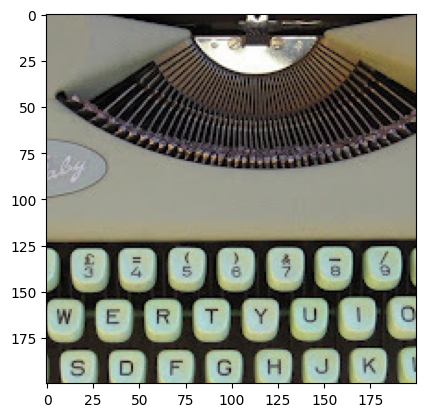

<Figure size 640x480 with 0 Axes>

In [ ]:
#Visualize images (they appear distorted when processed for clip)

images = next(iter(train_loader))

for image in images[0].squeeze(dim=1):
   
    plt.imshow(T.ToPILImage()(image.squeeze()))
    plt.figure()

## Simulating the electrodes

In [14]:
# Define the model for a single electrode (linear regression)

class LinearRegression(nn.Module):
    def __init__(self, input_size, output_size):
        super().__init__()
        self.linear = nn.Linear(input_size, output_size)
        
    def forward(self, x):
        return self.linear(x)

In [27]:
# Creating 124 electrodes

num_electrodes = 124
input_size = 120000 # Flattened image size
output_size = 1
electrodes = nn.ModuleList([LinearRegression(input_size, output_size).to(device) for _ in range(num_electrodes)])

# Pass the image through each electrode and collect the outputs

def readBrain(images, electrodes = electrodes):

    with torch.no_grad():
        brain_data = []
        for image in images: 
            electrode_data = []
            for electrode in electrodes:
                
                electrode_data.append(electrode(image.flatten()))

            # Concatenate the outputs into a single tensor
            electrodes_data = torch.cat(electrode_data, dim=0)

            brain_data.append(electrodes_data)
          

        brain_data = torch.stack(brain_data, dim=0)

        n_brain_data = brain_data + (0.3)*torch.randn(brain_data.shape).to(device)
    
        return n_brain_data

In [34]:
# Same as the function above, to be used for unbatched input

def readBrain_nobatch(image, electrodes = electrodes):

    with torch.no_grad():
        brain_data = []
        
        electrode_data = []
        for electrode in electrodes:
      
            electrode_data.append(electrode(image.flatten()))

        # Concatenate the outputs into a single tensor
        electrodes_data = torch.cat(electrode_data, dim=0)

        brain_data.append(electrodes_data)
          

        brain_data = torch.stack(brain_data, dim=0)

        n_brain_data = brain_data + (0.3)*torch.randn(brain_data.shape).to(device)
    
        return n_brain_data

## Reconstructing Latents from simulated electrodes

LinearRegression().fit(training_responses, training_latents)predicted_latents = reg.predict(test_responses)
Now, 
compare predicted_latents with test_latents using mean squared error.Feed predicted_latents to generative model -> 
predicted images.Feed test_latents to generative model -> target images.Compare the images.

In [ ]:
linear_reconstructor = LinearRegression()
train_losses = []
MSE_loss_function = nn.MSELoss(reduction='mean')

for i, batch in enumerate(train_loader):

    n_batches = n_batches + 1
    
    images, tokens = batch

    brain_data = readBrain(images)
    
    predicted = linear_reconstructor.predict(brain_data)
    
    loss = MSE_loss_function(predicted, tokens)
    
    train_losses.append(loss)

    linear_reconstructor.fit(brain_data, tokens)
    
    

#### Training

In [ ]:
os.mkdir(r"/workspace/project/scripts/Brain2Image/saved_checkpoints/scikit_linear")

In [38]:
torch.save(linear_reconstructor.state_dict(), r"/workspace/project/scripts/Brain2Image/saved_checkpoints/scikit_linear/scikit_linear_1")

In [19]:
# linear_reconstructor.load_state_dict(torch.load(r"/workspace/project/scripts/Brain2Image/saved_checkpoints/scikit_linear/scikit_linear_1"))

<All keys matched successfully>

#### Plotting Performance

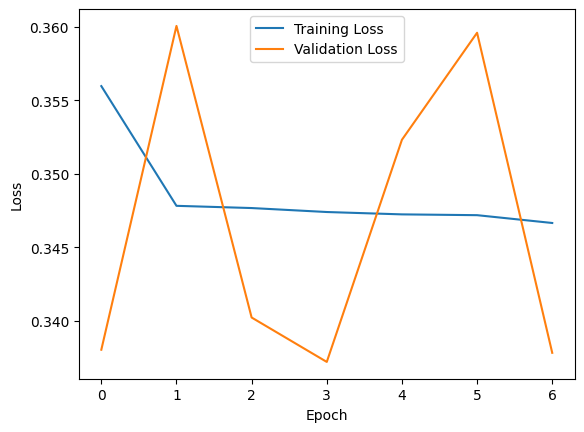

In [37]:
plt.plot(train_loss, label="Training Loss")
plt.plot(val_loss, label="Validation Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [26]:
untrained_reconstructor = LinearRegression(124, 768).to(device)
unt_loss = run_manager.test_run(untrained_reconstructor, test_loader)

torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([1

/workspace/env/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:858: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([1

/workspace/env/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:643: UserWarning: Metadata Warning, tag 33723 had too many entries: 48, expected 1
  warnings.warn(


torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([120000])
torch.Size([1

In [31]:
print("Loss before training: ", unt_loss, "Loss after training: ", train_loss)

Loss before training:  0.5405282754729432 Loss after training:  []


## Decoding from latents

In [32]:
# Cloud GPU needed

outpath="im_variations"
scale=3.0
h=512
w=512
n_samples=1
precision="fp32"
plms=True
ddim_steps=50
ddim_eta=0.0
device_idx=0
save=True
eval=True

In [ ]:
#CHANGE ATTEMPT NUMBER!


def makeImages(iterations):
    
    path = "/workspace/project/scripts/Brain2Image/outputs"
    folder_names = [int(name) for name in os.listdir(path) if name.isdigit()]
    last_attempt = max(folder_names)
    

    sample_path = fr"/workspace/project/scripts/Brain2Image/outputs/{last_attempt + 1}"
    
    

    os.makedirs(sample_path)

    if plms:
        sampler = PLMSSampler(model)
        ddim_eta = 0.0
    else:
        sampler = DDIMSampler(model)



    for i in range(iterations):
        
        batch = next(iter(test_loader))
        
        for img in batch:
            
            img, source_token = batch
            
        
            brain_data = readBrain_nobatch(img)
            reconstructed_token = linear_reconstructor(brain_data)
            
            torch.cuda.empty_cache()
            source_img = sample_model_from_embedding(source_token, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta)
            torch.cuda.empty_cache()
            rec_img = sample_model_from_embedding(reconstructed_token, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta)
            torch.cuda.empty_cache()

            source_img_rec = 255. * rearrange(source_img.cpu().numpy(), 'c h w -> h w c')
            rec_img = 255. * rearrange(rec_img.cpu().numpy(), 'c h w -> h w c')
            
        
            filename_s = os.path.join(sample_path, f"source_{i}")
            filename_r = os.path.join(sample_path, f"reconstructed_{i}")
            Image.fromarray(source_img_rec.astype(np.uint8)).save(filename_s)
            Image.fromarray(rec_img.astype(np.uint8)).save(filename_r)
            
        


In [ ]:
# Generated images = iterations * batch_size (*2)

iterations = 1

makeImages(iterations)

In [ ]:
@torch.no_grad()
def sample_model(input_im, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta):
    precision_scope = autocast if precision=="autocast" else nullcontext
    with precision_scope("cuda"):
        with model.ema_scope():
            c = model.get_learned_conditioning(input_im).tile(n_samples,1,1)

            if scale != 1.0:
                uc = torch.zeros_like(c)
            else:
                uc = None

            shape = [4, h // 8, w // 8]
            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples,
                                             shape=shape,
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc,
                                             eta=ddim_eta,
                                             x_T=None)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            return torch.clamp((x_samples_ddim + 1.0) / 2.0, min=0.0, max=1.0)